In [9]:
import torch
import importlib
import callback, my_attn, utils
importlib.reload(callback)
importlib.reload(my_attn)
importlib.reload(utils)
from diffusers import StableDiffusionPipeline, DDIMInverseScheduler, DDIMScheduler
from my_attn import prep_unet_attention
from tqdm.notebook import tqdm
from callback import QKVRecordCallback
from utils import load_image, img_to_latents, concat_img, interpolate_latents_and_inference


In [2]:
device = 'cuda'

pipe = StableDiffusionPipeline.from_pretrained(
    '/home/tom/fshare/models/runwayml/stable-diffusion-v1-5',
    safety_checker=None,
)
pipe.to(device)
vae = pipe.vae

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


#### Inverse the image and the canny version

In [7]:
num_inversion_steps = 250
target_size = (512, 512)
imgname_1 = 'images/atri.jpg'
imgname_2 = 'images/atri_canny.png'
input_img_1 = load_image(imgname_1, target_size=target_size).to(device=device)
input_img_2 = load_image(imgname_2, target_size=target_size).to(device=device)
prompt_inversion = "an anime girl with background"

with torch.no_grad():
    pipe.scheduler = DDIMInverseScheduler.from_pretrained(
        '/home/tom/fshare/models/runwayml/stable-diffusion-v1-5', subfolder='scheduler')
    latent_1 = img_to_latents(input_img_1, vae)
    latent_2 = img_to_latents(input_img_2, vae)
    latents = torch.cat([latent_1, latent_2], dim=0)
    inv_latents, _ = pipe(
        prompt='',
        guidance_scale=1,
        width=target_size[0],
        height=target_size[1],
        output_type='latent',
        return_dict=False,
        num_inference_steps=num_inversion_steps,
        latents=latents,
        num_images_per_prompt=2
    )

  0%|          | 0/250 [00:00<?, ?it/s]

In [4]:
pipe = StableDiffusionPipeline.from_pretrained(
    '/home/tom/fshare/models/runwayml/stable-diffusion-v1-5',
    safety_checker=None,
).to(device)
pipe.scheduler = DDIMScheduler.from_pretrained(
        '/home/tom/fshare/models/runwayml/stable-diffusion-v1-5', subfolder='scheduler')
torch.cuda.empty_cache()

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


#### Forward

  0%|          | 0/50 [00:00<?, ?it/s]

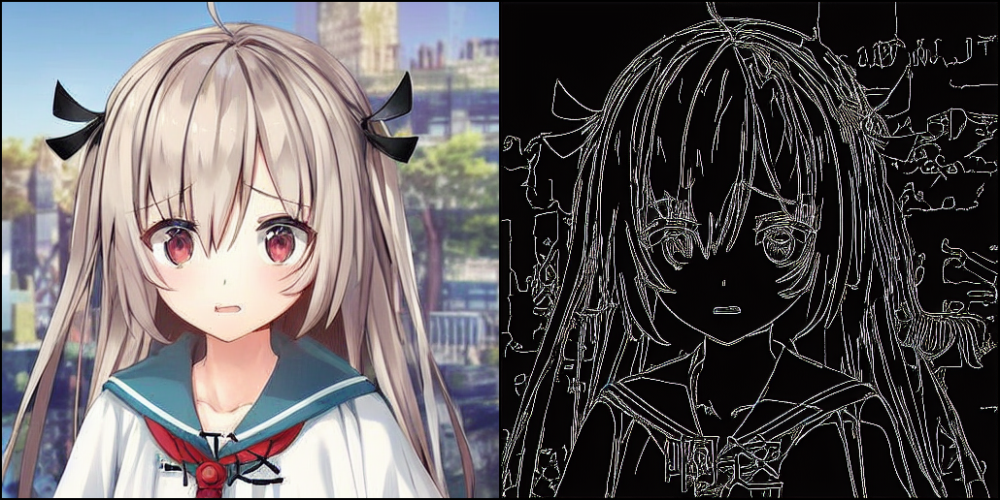

In [5]:
with torch.no_grad():
    pipe.scheduler = DDIMScheduler.from_pretrained(
        '/home/tom/fshare/models/runwayml/stable-diffusion-v1-5', subfolder='scheduler')
    inf_images, _ = pipe(
        prompt=prompt_inversion,
        guidance_scale=1,
        width=target_size[0],
        height=target_size[1],
        output_type='pt',
        return_dict=False,
        num_inference_steps=50,
        latents=inv_latents,
        num_images_per_prompt=2
    )
concat_img(inf_images)

#### Interpolate

  0%|          | 0/50 [00:00<?, ?it/s]

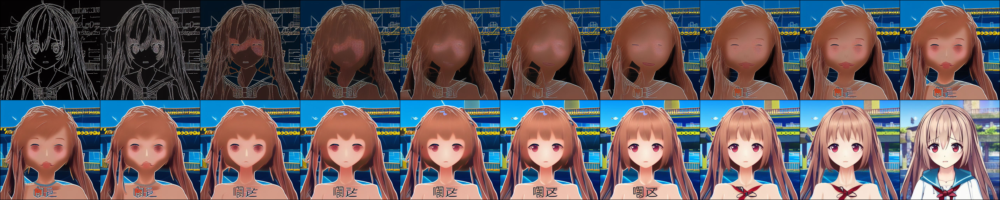

In [11]:
pipe.scheduler = DDIMScheduler.from_pretrained(
        '/home/tom/fshare/models/runwayml/stable-diffusion-v1-5', subfolder='scheduler')
interpolate_latents_and_inference(
    pipe, 
    prompt_inversion, 
    inv_latents[0], 
    inv_latents[1], 
    20, 
    guidance_scale=1,
    num_inference_steps=50
)

In [10]:
torch.cuda.empty_cache()